# FINAL SCRIPT

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import r2_score
from pathlib import Path
from sklearn.ensemble import ExtraTreesRegressor,RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn import set_config 

from time import process_time
from matplotlib import pyplot as plt
from sklearn.model_selection import cross_val_score

In [2]:
df=pd.read_csv('./2022_AIS_merged_ALLCSV.csv').drop(['Unnamed: 0'], axis=1, errors='ignore')
df

,BaseDateTime,LAT,LON,SOG,COG,Heading,IMO,VesselType,Status,Length,...,siconc,bottomT,usi,sithick,vsi,zos,thetao,so,vo,uo
0,2022-01-15 07:25:25,47.13891,-91.11550,7.7,71.0,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-01-15 07:27:45,47.14072,-91.10834,8.1,70.1,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-01-15 07:23:05,47.13720,-91.12231,7.3,71.2,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2022-01-15 07:26:35,47.13980,-91.11195,7.9,70.5,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-01-15 07:30:04,47.14257,-91.10111,8.0,70.1,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192430,2022-01-15 06:05:54,47.08739,-91.32984,8.0,71.5,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192431,2022-01-15 07:20:45,47.13567,-91.12878,7.1,72.4,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192432,2022-01-15 07:21:54,47.13642,-91.12557,7.1,72.1,69.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192433,2022-01-15 07:19:34,47.13495,-91.13200,7.1,73.9,70.0,IMO7514701,70.0,8.0,304.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


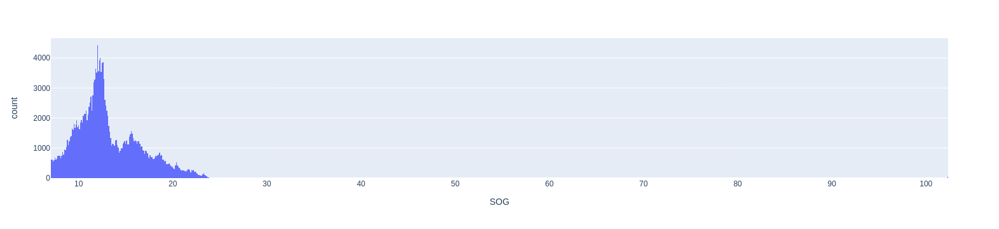

In [3]:
import plotly.express as px
fig = px.histogram(df['SOG'], x="SOG")
fig.show()

In [4]:
import numpy as np
data = df['SOG']
mean = np.mean(data)
std = np.std(data)
threshold = 5
outlier = [abs((i-mean)/std) >= threshold for i in data]
df['is_outlier'] = outlier

<Axes: xlabel='index', ylabel='SOG'>

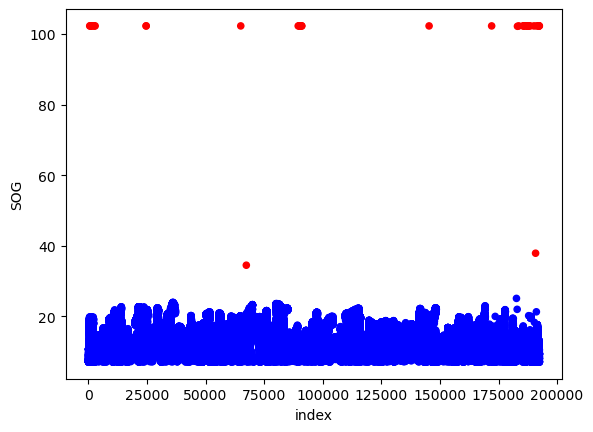

In [5]:
df.reset_index().plot(x='index', y='SOG', kind='scatter', c=df['is_outlier'], cmap='bwr',colorbar=False)

In [6]:
df=df[df['is_outlier']==False]

In [7]:
import pandas as pd
year = 2022
df = df
print(len(df))
df_export=df.copy()
# calculate relative windwave direction
df["COG_true"] = df["COG"]
df.loc[df["COG_true"] < 0, "COG_true"] = 360 + df["COG_true"]
df["rel_dir"] = abs(df["COG_true"] - df["VMDR_WW"])
df["dir_4"] = 2
df.loc[((df["rel_dir"] < 45) | (df["rel_dir"] > 315)), "dir_4"] = 1
df.loc[((df["rel_dir"] > 135) & (df["rel_dir"] < 225)) , "dir_4"] = 3

# calculate resistance of ship with simple approach
df["resist"] = df["Length"] * df["Width"] * df["Draft"]

# subset dataframe
df= df[['SOG', 'IMO', 'resist', 'Length', 'Width', 'Draft', 'COG', 'Heading', 
        'VHM0_WW', 'VMDR_SW2', 'VMDR_SW1','VMDR',  'VTM10', 'VTPK','VPED',
        'VTM02','VMDR_WW','VTM01_SW2','VHM0_SW1','VTM01_SW1','VSDX','VSDY',
        'VHM0','VTM01_WW','VHM0_SW2'] 
       + ['thetao', 'so', 'uo', 'vo', 'zos', 'mlotst',
       'bottomT']
       + ["rel_dir", "COG_true", "dir_4"]]
# df = df[subset]

# drop NAs and calculate correlation
df = df.dropna()
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')

192390


/tmp/ipykernel_618265/4121389361.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_618265/4121389361.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_618265/4121389361.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykern

,SOG,resist,Length,Width,Draft,COG,Heading,VHM0_WW,VMDR_SW2,VMDR_SW1,VMDR,VTM10,VTPK,VPED,VTM02,VMDR_WW,VTM01_SW2,VHM0_SW1,VTM01_SW1,VSDX,VSDY,VHM0,VTM01_WW,VHM0_SW2,thetao,so,uo,vo,zos,mlotst,bottomT,rel_dir,COG_true,dir_4
SOG,1.000000,0.060896,0.177617,0.090046,-0.161059,-0.146324,-0.146402,0.009551,-0.018050,0.071194,0.102836,0.144088,0.131807,0.068803,0.124764,0.110933,0.119224,0.096249,0.083829,0.024320,-0.106321,0.124518,0.036803,0.257328,0.042236,0.095003,0.112591,-0.038179,0.083072,0.024343,-0.197484,0.052296,-0.146324,0.068457
resist,0.060896,1.000000,0.920993,0.891000,0.658794,0.090814,0.088176,-0.031400,-0.024230,0.073158,0.081279,0.065138,0.053613,0.035871,0.042524,0.068083,0.073120,0.023909,0.020068,0.119434,-0.074017,0.011413,-0.036926,0.030901,-0.031871,-0.000153,-0.071252,-0.065662,-0.092410,-0.081681,0.010393,-0.037452,0.090814,-0.003499
Length,0.177617,0.920993,1.000000,0.862625,0.413210,0.057475,0.057298,-0.014652,-0.035862,0.085429,0.085286,0.095817,0.078244,0.032712,0.082916,0.091330,0.093014,0.036708,0.045536,0.106479,-0.087607,0.037266,-0.026665,0.054821,-0.047577,0.003884,-0.079502,-0.064114,-0.127882,-0.061752,0.029565,-0.047674,0.057475,-0.016655
Width,0.090046,0.891000,0.862625,1.000000,0.334890,0.086742,0.084804,0.012707,-0.025700,0.120813,0.127975,0.099956,0.078778,0.076386,0.095178,0.128137,0.105144,0.082324,0.051627,0.175313,-0.073590,0.081876,0.000004,0.068695,-0.103343,-0.042056,-0.078958,-0.087078,-0.115930,-0.080476,0.037060,-0.040265,0.086742,-0.013770
Draft,-0.161059,0.658794,0.413210,0.334890,1.000000,0.102997,0.096427,-0.123543,-0.004500,-0.079698,-0.080884,-0.054168,-0.032652,-0.092032,-0.095110,-0.088619,-0.035890,-0.096552,-0.065754,-0.026223,-0.031913,-0.141338,-0.107963,-0.083398,0.115463,0.049820,-0.004987,0.024030,0.021759,-0.056318,-0.018762,-0.003494,0.102997,0.020913
COG,-0.146324,0.090814,0.057475,0.086742,0.102997,1.000000,0.939845,0.028256,0.182298,0.254694,0.242763,0.202838,0.235314,0.225644,0.158011,0.148916,0.219657,0.078018,0.170758,0.132866,-0.237781,0.106706,-0.011713,0.092985,-0.235082,-0.088954,-0.194984,-0.187487,0.104389,-0.017454,-0.156664,-0.148598,1.000000,-0.184763
Heading,-0.146402,0.088176,0.057298,0.084804,0.096427,0.939845,1.000000,0.036535,0.173934,0.250401,0.239901,0.203732,0.235194,0.222290,0.159828,0.156585,0.224418,0.081833,0.170047,0.145130,-0.235452,0.111865,-0.002585,0.094077,-0.229524,-0.080934,-0.164072,-0.167412,0.102732,-0.017421,-0.155751,-0.162308,0.939845,-0.184741
VHM0_WW,0.009551,-0.031400,-0.014652,0.012707,-0.123543,0.028256,0.036535,1.000000,0.042278,0.044924,0.084511,-0.038673,-0.072138,0.093985,0.009613,0.136505,0.051102,0.207533,0.164914,0.168760,-0.311251,0.605217,0.922165,0.180112,-0.139690,0.123152,-0.025197,0.017061,0.039270,0.390595,-0.131091,0.006458,0.028256,-0.011430
VMDR_SW2,-0.018050,-0.024230,-0.035862,-0.025700,-0.004500,0.182298,0.173934,0.042278,1.000000,0.254982,0.350915,0.254880,0.237796,0.323799,0.237551,0.172529,0.146452,0.150401,0.222853,0.311765,-0.103087,0.165217,-0.006862,0.122187,-0.255059,-0.083351,-0.061150,-0.176942,0.166674,0.017667,-0.222204,-0.008468,0.182298,-0.057854
VMDR_SW1,0.071194,0.073158,0.085429,0.120813,-0.079698,0.254694,0.250401,0.044924,0.254982,1.000000,0.744780,0.426191,0.368529,0.785248,0.410407,0.315722,0.419730,0.307887,0.269095,0.404235,-0.134637,0.313444,0.000356,0.313660,-0.445664,-0.118478,-0.140933,-0.307906,0.234685,-0.044111,-0.371191,-0.051528,0.254694,-0.024552


/tmp/ipykernel_618265/2793700089.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



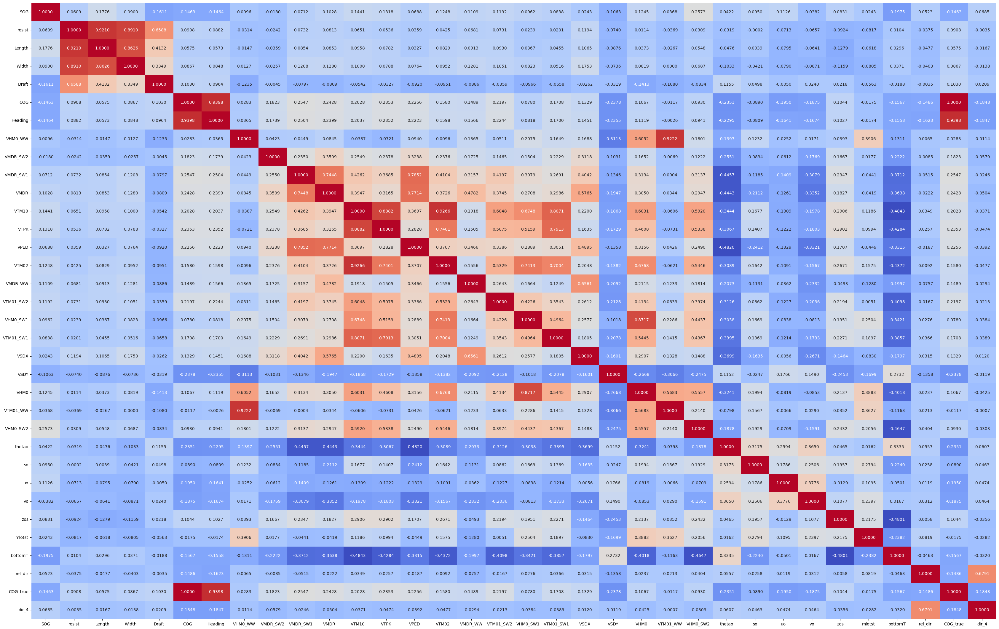

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(42, 27))
sns.heatmap(df.corr(), annot=True, fmt='.4f', 
            cmap=plt.get_cmap('coolwarm'), cbar=False, ax=ax)
ax.set_yticklabels(ax.get_yticklabels(), rotation='horizontal')
plt.savefig('./correlation.png', bbox_inches='tight', pad_inches=0.0)

In [10]:
df

,SOG,IMO,resist,Length,Width,Draft,COG,Heading,VHM0_WW,VMDR_SW2,...,thetao,so,uo,vo,zos,mlotst,bottomT,rel_dir,COG_true,dir_4
273,15.9,IMO9283203,131648.0,272.0,40.0,12.1,128.2,126.0,0.206667,141.040009,...,15.674554,28.430107,0.007280,-0.006407,-0.312420,7.065513,15.663486,126.533337,128.2,2
282,15.2,IMO9283203,131648.0,272.0,40.0,12.1,83.7,84.0,0.200000,125.309998,...,15.674554,28.430107,0.007280,-0.006407,-0.312420,7.065513,15.663486,184.289990,83.7,3
283,16.3,IMO9283203,131648.0,272.0,40.0,12.1,136.6,138.0,0.206667,141.040009,...,15.674554,28.430107,0.007280,-0.006407,-0.312420,7.065513,15.663486,118.133337,136.6,2
284,17.8,IMO9283203,131648.0,272.0,40.0,12.1,86.2,86.0,0.200000,125.309998,...,15.674554,28.430107,0.007280,-0.006407,-0.312420,7.065513,15.663486,181.789990,86.2,3
288,17.4,IMO9283203,131648.0,272.0,40.0,12.1,86.6,86.0,0.200000,125.309998,...,15.674554,28.430107,0.007280,-0.006407,-0.312420,7.065513,15.663486,181.389990,86.6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191817,15.8,IMO9213454,63680.0,199.0,32.0,10.0,335.1,337.0,0.000000,99.043335,...,7.033753,28.485470,0.021973,-0.002645,0.268563,10.528887,7.510331,313.916660,335.1,2
191818,15.1,IMO9213454,63680.0,199.0,32.0,10.0,336.5,335.0,0.123333,198.986664,...,7.199286,28.640095,0.010987,0.020142,0.291147,10.528887,7.533281,215.943336,336.5,3
191819,15.7,IMO9213454,63680.0,199.0,32.0,10.0,334.1,335.0,0.123333,198.986664,...,7.199286,28.640095,0.010987,0.020142,0.291147,10.528887,7.533281,213.543336,334.1,3
191820,15.1,IMO9213454,63680.0,199.0,32.0,10.0,343.0,340.0,0.123333,198.986664,...,7.199286,28.640095,0.010987,0.020142,0.291147,10.528887,7.533281,222.443336,343.0,3


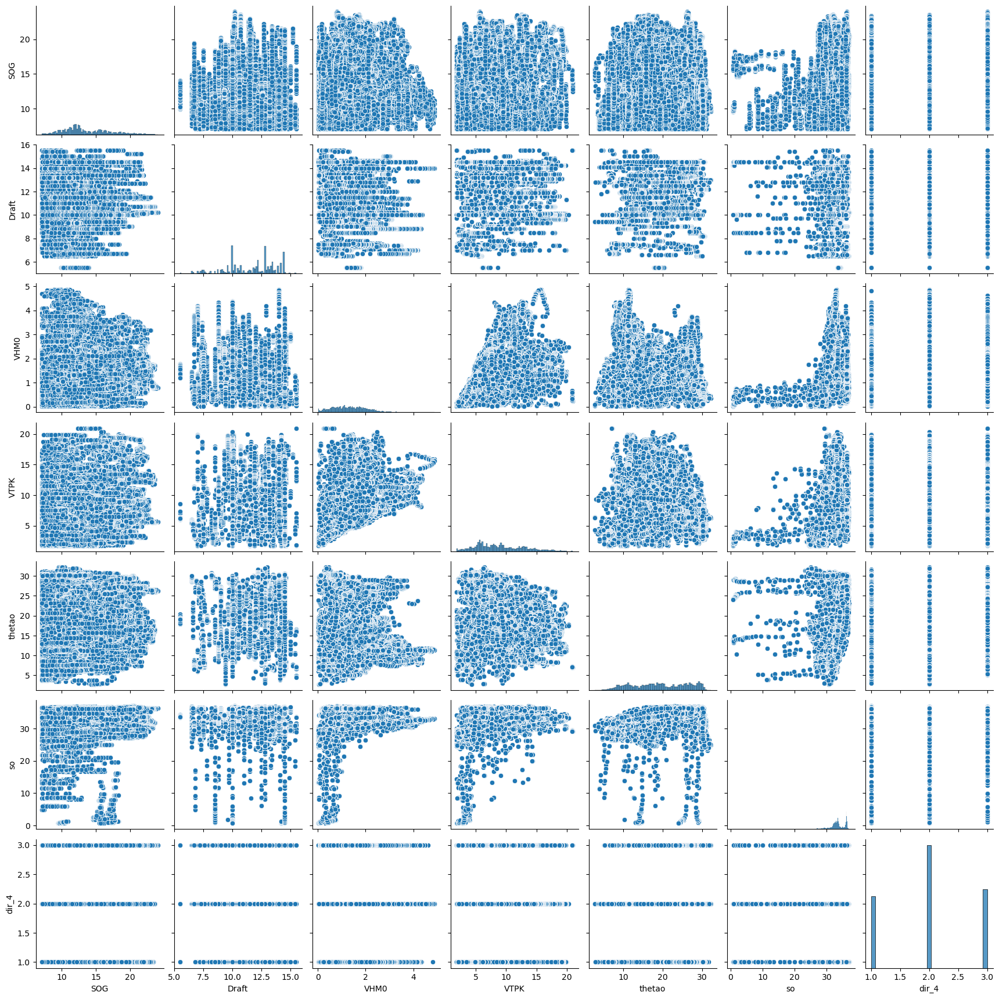

In [103]:
import seaborn as sns
subset = ["SOG", "Draft", "VHM0", "VTPK", "thetao", "so", "dir_4"]
sns.pairplot(df[subset])

In [11]:
subset=['resist','Draft',
        'VHM0_WW', 'VMDR_SW2', 'VMDR_SW1', 'VTM10','VMDR_WW','VTM01_SW2','VHM0_SW1','VSDX','VSDY',
        'VHM0','VHM0_SW2','thetao', 'so', 'uo', 'vo', 'zos', 'mlotst','bottomT', "dir_4"]

In [12]:
X = df[subset].copy()
y = df["SOG"].copy()

In [13]:
X.describe()


,resist,Draft,VHM0_WW,VMDR_SW2,VMDR_SW1,VTM10,VMDR_WW,VTM01_SW2,VHM0_SW1,VSDX,...,VHM0,VHM0_SW2,thetao,so,uo,vo,zos,mlotst,bottomT,dir_4
count,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,...,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000,150169.000000
mean,96252.505995,11.604352,0.559739,181.153463,194.652994,7.473675,202.195649,7.962601,1.005607,0.008072,...,1.418262,0.443532,19.448534,32.766877,0.031541,0.067194,0.028525,20.110525,8.276924,2.025192
std,46736.308119,2.117462,0.600067,82.697181,97.450171,2.675543,108.376951,4.027449,0.700218,0.049257,...,0.832766,0.322738,6.973504,3.941186,0.215428,0.339958,0.269392,13.010514,7.798501,0.741949
min,33088.000000,5.500000,0.000000,0.130005,0.020004,1.610000,0.020004,0.840000,0.010000,-0.210000,...,0.010000,0.000000,2.740689,0.727407,-0.844142,-1.519128,-0.764345,5.845199,1.007800,1.000000
25%,63680.000000,10.000000,0.130000,123.893341,118.266670,5.390000,111.410004,4.720000,0.530000,-0.020000,...,0.796667,0.190000,13.457203,32.109112,-0.070625,-0.096020,-0.093255,10.737730,1.417074,1.000000
50%,79360.000000,12.100000,0.376667,186.653336,185.500000,7.350000,213.429993,7.040000,0.873333,0.010000,...,1.333333,0.380000,19.413839,33.238102,0.005994,-0.004941,0.079924,15.207407,6.514246,2.000000
75%,103219.200000,13.300000,0.800000,236.436676,287.440002,9.463333,309.320007,11.236668,1.320000,0.040000,...,1.906667,0.643333,25.845135,35.026081,0.078569,0.085527,0.215105,24.772829,11.653375,3.000000
max,272304.000000,15.500000,3.940000,359.649994,359.909973,14.849999,359.979980,23.299999,4.860000,0.180000,...,4.870000,2.630000,32.182991,36.905716,1.638641,1.790849,0.808989,119.757385,32.174564,3.000000


In [14]:
y.describe()

count    150169.000000
mean         13.658194
std           3.433109
min           7.100000
25%          11.300000
50%          12.700000
75%          16.000000
max          24.000000
Name: SOG, dtype: float64

In [15]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4)

### DECISION TREE REGRESSOR

In [16]:
# Build DT model and finetune
set_config(print_changed_only=False) 
dt = DecisionTreeRegressor(criterion = "friedman_mse")#, max_depth=10)
print(dt)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='friedman_mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      random_state=None, splitter='best')


mean cross validation score: 0.9820567380835667
Elapsed time in seconds:  10.753359939

Elapsed time in seconds:  1.1150654489999994
R2:  0.9823531233884144

Draft 0.27811580553407267
resist 0.19947270489063532
bottomT 0.1224593988414899
so 0.07112426791009617
zos 0.03633954550680754
VTM10 0.028505135850940513
VMDR_SW1 0.0253269773413293
VHM0_SW2 0.02332843037583224
mlotst 0.02298665169964384
vo 0.022925251269315033
VMDR_SW2 0.02043493163823392
VHM0_WW 0.019683279237484922
VHM0 0.018389114338441395
VMDR_WW 0.01796904109975442
VHM0_SW1 0.016698578801955747
VSDY 0.015912914620103465
VSDX 0.015503799972040858
uo 0.013967645258497079
thetao 0.013223408506269652
VTM01_SW2 0.010879642113672329
dir_4 0.006753475193383518


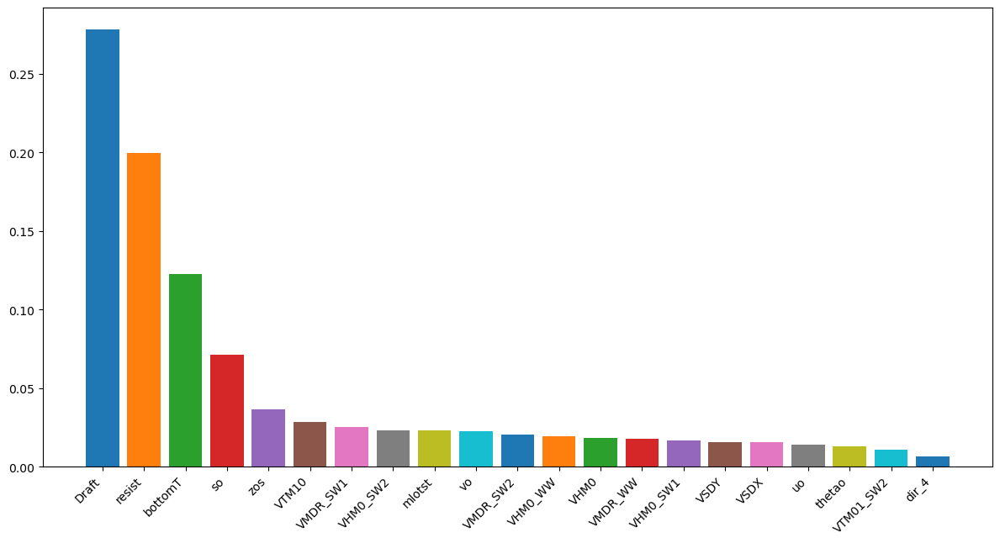

Elapsed time in seconds:  0.02312045699999743


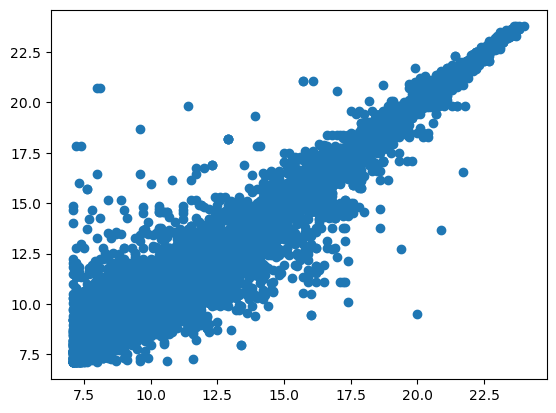

In [20]:
# Train DT model


t_start = process_time()
dt_scores = cross_val_score(dt, X_train, y_train, cv = 10)
t_stop = process_time()
print("mean cross validation score: {}".format(np.mean(dt_scores)))
time_dt = t_stop-t_start
print("Elapsed time in seconds: ", time_dt)

print("")
t_start = process_time()
model_dt = dt.fit(X_train, y_train)
t_stop = process_time()

time_dt = t_stop-t_start
print("Elapsed time in seconds: ", time_dt)


r2_dt = model_dt.score(X_test, y_test)
print("R2: ", r2_dt)

print("")
plt.figure(figsize=(12,6))
# importance of independent variables for decision tree regression model
for importance, name in sorted(zip(dt.feature_importances_, X_train.columns),reverse=True):
 print (name, importance)
 plt.bar(name, importance, align='center')

plt.tight_layout()
ax = plt.gca() # Obtiene el objeto ax actual
ax.set_xticks(X_train.columns) # Establece las posiciones de los xticks
ax.set_xticklabels(X_train.columns, rotation=45, ha='right') # Establece las etiquetas de los xticks y las rota 45 grados
plt.show()

t_start = process_time()
y_pred = model_dt.predict(X_test)
time_dt = process_time()-t_start
print("Elapsed time in seconds: ", time_dt)
plt.scatter(y_test, y_pred)

In [21]:
pd.DataFrame(dt_scores).describe()

,0
count,10.000000
mean,0.982057
std,0.001957
min,0.979381
25%,0.980396
50%,0.982345
75%,0.982948
max,0.985708


In [22]:
# Evaluate
y_pred = model_dt.predict(X_test)
print("R Squared Score is:", metrics.r2_score(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R Squared Score is: 0.9823531233884144
Mean Absolute Error: 0.1801048271765236
Mean Squared Error: 0.20814274514789247
Root Mean Squared Error: 0.4562266379201158


In [23]:
from joblib import dump, load

In [24]:
dump(model_dt,'./DTR_model.joblib')

['./DTR_model.joblib']

### LINERA REGRESSOR

In [25]:
# Build LR model and finetune
set_config(print_changed_only=False) 
lr = LinearRegression()
print(lr)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, positive=False)


mean cross validation score: 0.19963819859505258
Elapsed time in seconds:  2.681833449999999

Elapsed time in seconds:  0.4348325040000063
R2:  0.20459651477382879

uo 2.116445455026869
VHM0_SW2 1.6280938394588436
VHM0 1.1164007930320252
dir_4 0.2955817929444924
thetao 0.07188807461788406
VTM01_SW2 0.010825920284908891
VMDR_WW 0.0018938516096334568
resist 2.310072150583271e-05
VMDR_SW2 -0.0007044030454893963
VMDR_SW1 -0.0012706728870844897
so -0.0028968690841913213
mlotst -0.00919900157711892
zos -0.08490873121503116
bottomT -0.08494540864924197
VTM10 -0.11074975844355106
Draft -0.6149981753727775
VHM0_SW1 -0.7139555755809892
vo -0.8878245647173906
VHM0_WW -1.0768980741421663
VSDY -3.4566504077323983
VSDX -5.237388035210857


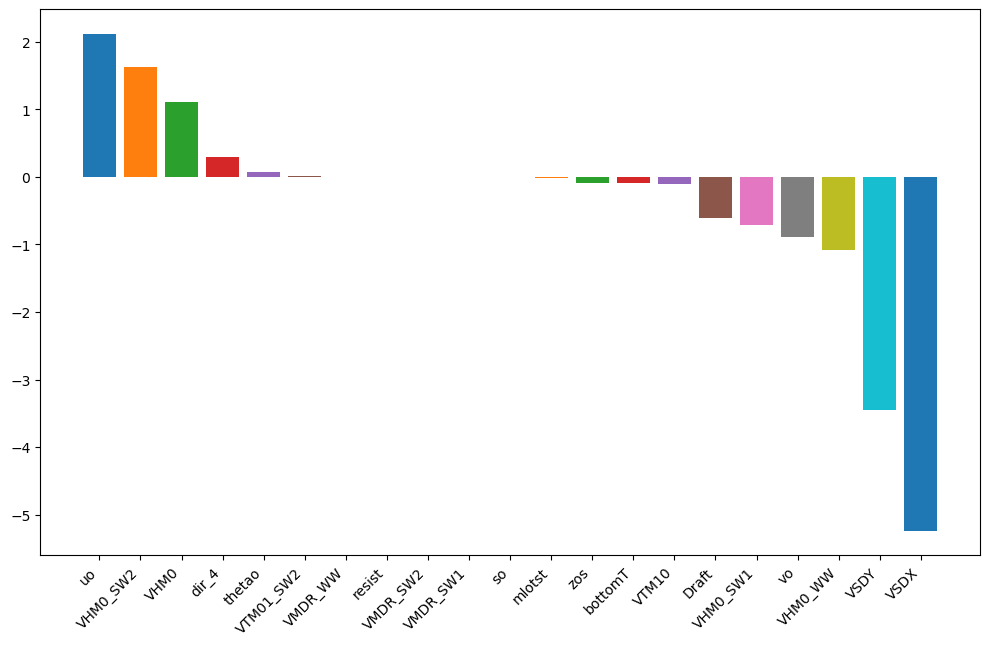

Elapsed time in seconds:  0.006305410999999594


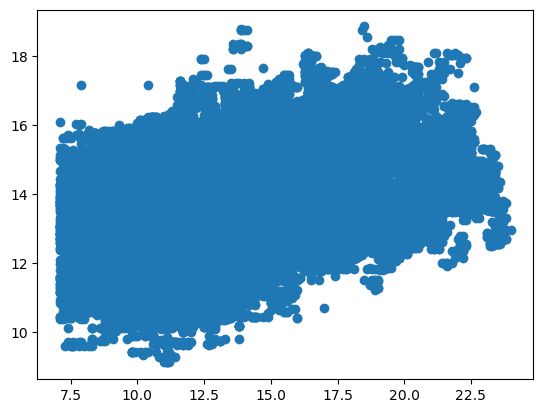

In [26]:
# Train LR model


t_start = process_time()
lr_scores = cross_val_score(lr, X_train, y_train, cv = 10)
t_stop = process_time()
print("mean cross validation score: {}".format(np.mean(lr_scores)))
time_lr = t_stop-t_start
print("Elapsed time in seconds: ", time_lr)
print("")
t_start = process_time()
model_lr = lr.fit(X_train, y_train)
t_stop = process_time()

time_lr = t_stop-t_start
print("Elapsed time in seconds: ", time_lr)

r2_lr= model_lr.score(X_test, y_test)
print("R2: ", r2_lr)
print("")
plt.figure(figsize=(10,6))
# importance of independent variables for linear regression model
for importance, name in sorted(zip(lr.coef_, X_train.columns),reverse=True):
 print (name, importance)
 plt.bar(name, importance)

plt.tight_layout()
ax = plt.gca() # Obtiene el objeto ax actual
ax.set_xticks(X_train.columns) # Establece las posiciones de los xticks
ax.set_xticklabels(X_train.columns, rotation=45, ha='right') # Establece las etiquetas de los xticks y las rota 45 grados
plt.show()


t_start = process_time()
y_pred = model_lr.predict(X_test)
time_lr = process_time()-t_start
print("Elapsed time in seconds: ", time_lr)
plt.scatter(y_test, y_pred)

In [27]:
pd.DataFrame(lr_scores).describe()

,0
count,10.000000
mean,0.199638
std,0.007912
min,0.185643
25%,0.194679
50%,0.200882
75%,0.203311
max,0.214621


In [28]:
# Evaluate
y_pred = model_lr.predict(X_test)
print("R Squared Score is:", metrics.r2_score(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R Squared Score is: 0.20459651477382879
Mean Absolute Error: 2.382351813733254
Mean Squared Error: 9.381686547662701
Root Mean Squared Error: 3.0629538925133533


In [29]:
dump(model_lr,'./LR_model.joblib')

['./LR_model.joblib']

### Extra Tree Regressor

In [30]:
# Build ETR model and finetune
set_config(print_changed_only=False) 
ext =ExtraTreesRegressor(criterion = "friedman_mse")#, max_depth=10)
print(ext)

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='friedman_mse',
                    max_depth=None, max_features=1.0, max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_samples_leaf=1, min_samples_split=2,
                    min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
                    oob_score=False, random_state=None, verbose=0,
                    warm_start=False)


mean cross validation score: 0.984769078704835
Elapsed time in seconds:  265.640562457

Elapsed time in seconds:  30.871577039999977
R2:  0.9851334285193022

Draft 0.24188358013386857
resist 0.1486672014692121
bottomT 0.08499901180602026
thetao 0.049652834365793735
so 0.04225016801812067
VHM0_SW2 0.03964275550645796
VHM0 0.03908183433704865
VTM10 0.03489784901076691
zos 0.03173238948981437
VMDR_WW 0.03155904693296886
dir_4 0.029868093470946856
VSDY 0.02967248962281857
VMDR_SW1 0.028011789018402244
VHM0_SW1 0.0280078882402436
VSDX 0.025681876130456652
VHM0_WW 0.02546620394152068
vo 0.022840027878651213
VTM01_SW2 0.01845262978540354
mlotst 0.01633416345338327
uo 0.01586043985975065
VMDR_SW2 0.015437727528350577


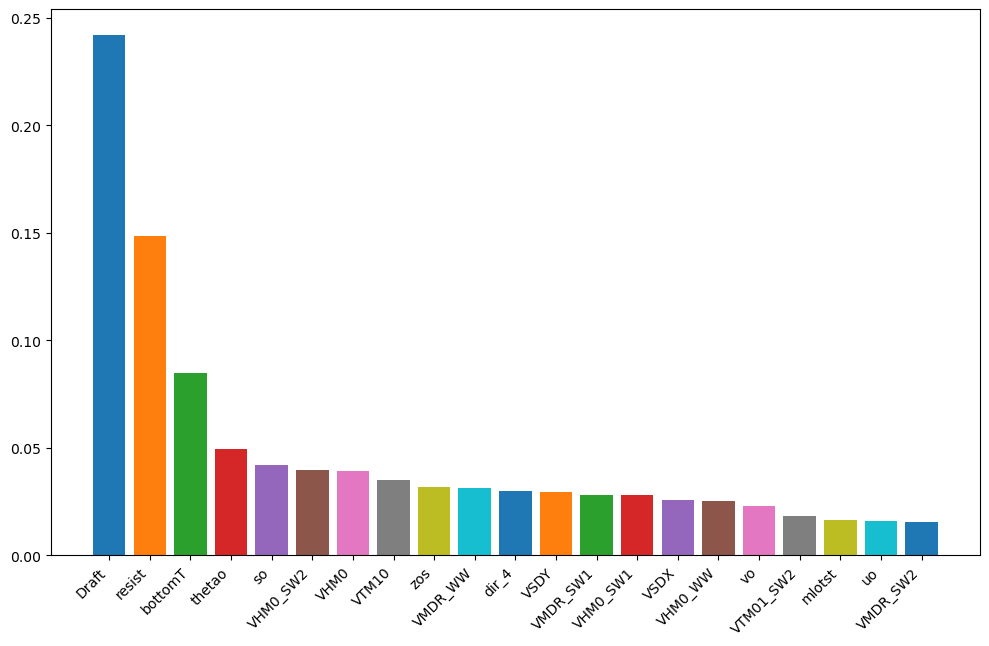

Elapsed time in seconds:  1.685461375999978


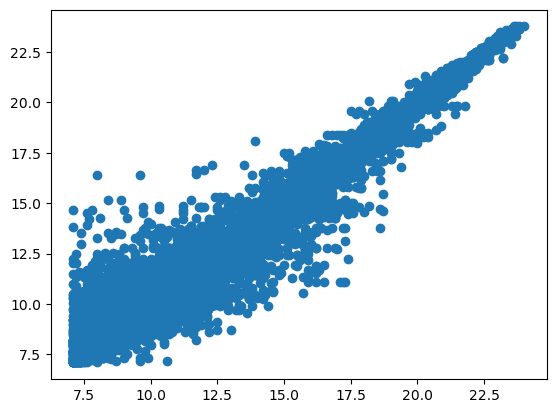

In [31]:
# Train ETR model


t_start = process_time()
ext_scores = cross_val_score(ext, X_train, y_train, cv = 10)
t_stop = process_time()
print("mean cross validation score: {}".format(np.mean(ext_scores)))
time_ext = t_stop-t_start
print("Elapsed time in seconds: ", time_ext)
print("")
t_start = process_time()
model_ext= ext.fit(X_train, y_train)
t_stop = process_time()

time_ext = t_stop-t_start
print("Elapsed time in seconds: ", time_ext)

r2_ext = model_ext.score(X_test, y_test)
print("R2: ", r2_ext)

print("")
plt.figure(figsize=(10,6))
# importance of independent variables for extra tree regression model
for importance, name in sorted(zip(ext.feature_importances_, X_train.columns),reverse=True):
 print (name, importance)
 plt.bar(name, importance)

plt.tight_layout()
ax = plt.gca() # Obtiene el objeto ax actual
ax.set_xticks(X_train.columns) # Establece las posiciones de los xticks
ax.set_xticklabels(X_train.columns, rotation=45, ha='right') # Establece las etiquetas de los xticks y las rota 45 grados
plt.show()


t_start = process_time()
y_pred = model_ext.predict(X_test)
time_ext = process_time()-t_start
print("Elapsed time in seconds: ", time_ext)
plt.scatter(y_test, y_pred)

In [32]:
pd.DataFrame(ext_scores).describe()

,0
count,10.000000
mean,0.984769
std,0.001320
min,0.982646
25%,0.983848
50%,0.984995
75%,0.985967
max,0.986310


In [33]:
# Evaluate
y_pred = model_ext.predict(X_test)
print("R Squared Score is:", metrics.r2_score(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R Squared Score is: 0.9851334285193022
Mean Absolute Error: 0.17583163028185367
Mean Squared Error: 0.17534938714867426
Root Mean Squared Error: 0.41874740255752546


In [34]:
dump(model_ext,'./EXT_model.joblib')

['./EXT_model.joblib']

### Random Forest Regressor

In [35]:
# Build RFR model and finetune
set_config(print_changed_only=False) 
rfr =RandomForestRegressor(criterion = "friedman_mse")#, max_depth=10)
print(rfr)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='friedman_mse',
                      max_depth=None, max_features=1.0, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)


mean cross validation score: 0.9836224706283524
Elapsed time in seconds:  794.4409877009999

Elapsed time in seconds:  87.2759300319999
R2:  0.983940379726467

Draft 0.2775311346445625
resist 0.19447383073806215
bottomT 0.12812187354002041
so 0.07074625966663976
zos 0.03435039215961277
VTM10 0.031337256089361255
VMDR_SW1 0.025311768160657753
vo 0.02097302474270616
VMDR_WW 0.020222986392426787
thetao 0.019375987198359115
VHM0_SW2 0.01919334145215244
VHM0 0.019170276744148892
mlotst 0.01914384915885194
VMDR_SW2 0.01800193547130272
VHM0_WW 0.017671387635797266
VSDY 0.017238520105655852
VSDX 0.016777254228176417
VHM0_SW1 0.016513083734954893
uo 0.014257059984133206
VTM01_SW2 0.013532325071788634
dir_4 0.006056453080629161


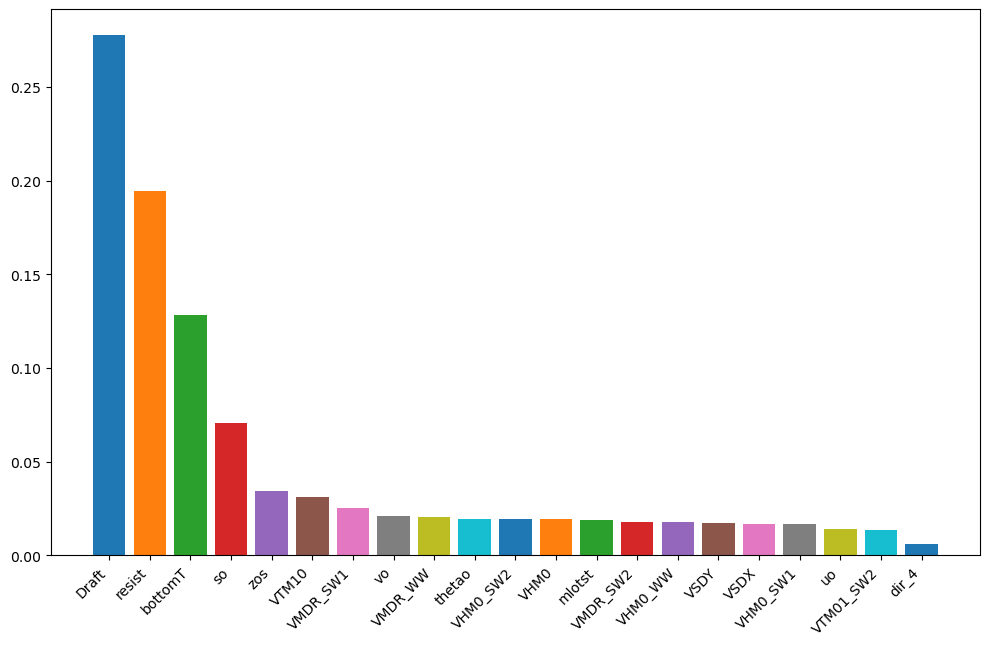

Elapsed time in seconds:  1.7143760169999496


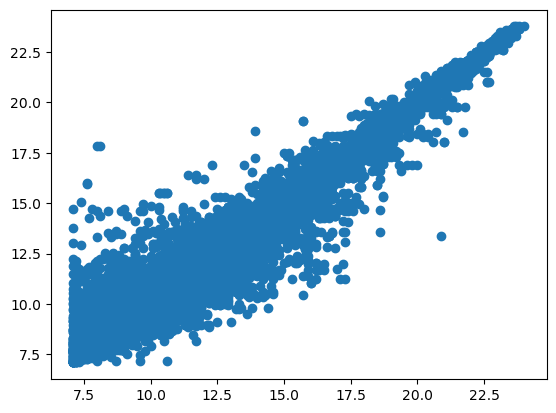

In [36]:
# Train RFR model


t_start = process_time()
rfr_scores = cross_val_score(rfr, X_train, y_train, cv = 10)
t_stop = process_time()
print("mean cross validation score: {}".format(np.mean(rfr_scores)))
time_rfr = t_stop-t_start
print("Elapsed time in seconds: ", time_rfr)
print("")
t_start = process_time()
model_rfr= rfr.fit(X_train, y_train)
t_stop = process_time()

time_rfr = t_stop-t_start
print("Elapsed time in seconds: ", time_rfr)

r2_rfr = model_rfr.score(X_test, y_test)
print("R2: ", r2_rfr)

print("")
plt.figure(figsize=(10,6))
# importance of independent variables for random forest regression model
for importance, name in sorted(zip(rfr.feature_importances_, X_train.columns),reverse=True):
 print (name, importance)
 plt.bar(name, importance)

plt.tight_layout()
ax = plt.gca() # Obtiene el objeto ax actual
ax.set_xticks(X_train.columns) # Establece las posiciones de los xticks
ax.set_xticklabels(X_train.columns, rotation=45, ha='right') # Establece las etiquetas de los xticks y las rota 45 grados
plt.show()

t_start = process_time()
y_pred = model_rfr.predict(X_test)
time_rfr = process_time()-t_start
print("Elapsed time in seconds: ", time_rfr)
plt.scatter(y_test, y_pred)

In [37]:
pd.DataFrame(rfr_scores).describe()

,0
count,10.000000
mean,0.983622
std,0.001279
min,0.982133
25%,0.982536
50%,0.983625
75%,0.984683
max,0.985716


In [38]:
# Evaluate
y_pred = model_rfr.predict(X_test)
print("R Squared Score is:", metrics.r2_score(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R Squared Score is: 0.983940379726467
Mean Absolute Error: 0.18165738630099634
Mean Squared Error: 0.18942125132621776
Root Mean Squared Error: 0.4352255177792517


In [39]:
dump(model_rfr,'./RFR_model.joblib')

['./RFR_model.joblib']

In [40]:
!pip install xgboost

In [41]:
import xgboost as xgb

In [42]:
xgbr = xgb.XGBRegressor(verbosity=0) 
print(xgbr)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             objective='reg:squarederror', predictor=None, ...)


mean cross validation score: 0.9610721130596545
Elapsed time in seconds:  200.648404218

Elapsed time in seconds:  19.909278065999843
R2:  0.9606556931224636

Draft 0.3840532
resist 0.12242574
bottomT 0.11303689
so 0.05222932
VSDY 0.040821657
VHM0_SW2 0.030636987
VTM10 0.026607728
VHM0 0.026596146
VSDX 0.026590193
zos 0.025951011
VMDR_SW1 0.019683717
vo 0.017776292
mlotst 0.017594356
VHM0_SW1 0.017415937
thetao 0.017189488
VTM01_SW2 0.013305268
VMDR_WW 0.011868282
VHM0_WW 0.010381911
VMDR_SW2 0.00971483
uo 0.009711071
dir_4 0.0064100027


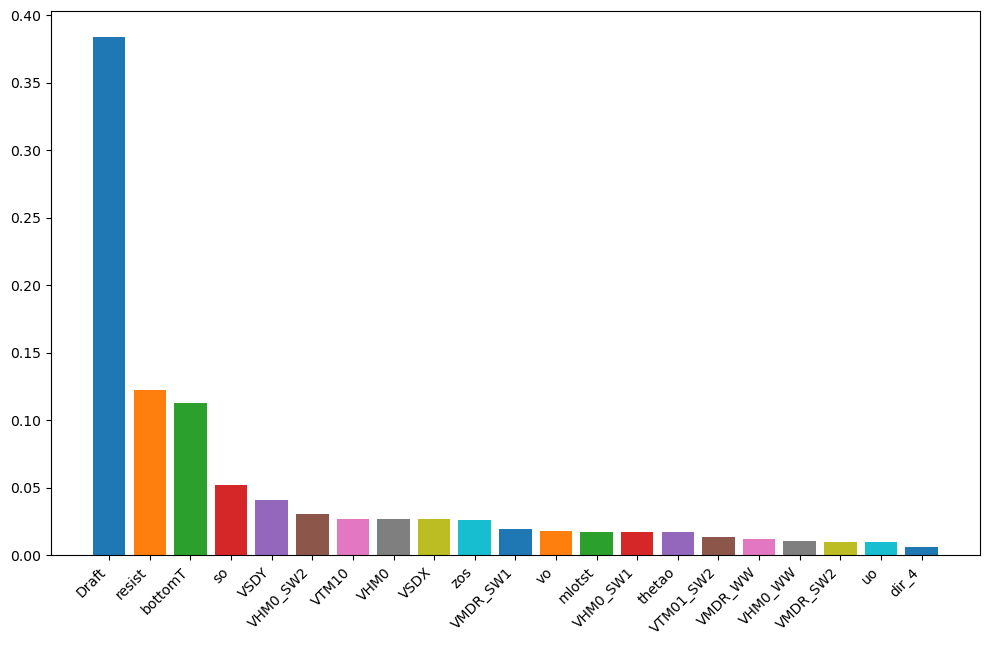

Elapsed time in seconds:  0.1772475709999526


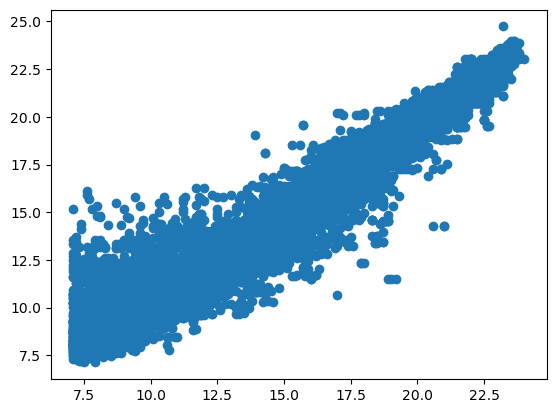

In [43]:
# Train XGBR model


t_start = process_time()
xgbr_scores = cross_val_score(xgbr, X_train, y_train, cv = 10)
t_stop = process_time()
print("mean cross validation score: {}".format(np.mean(xgbr_scores)))
time_xgbr = t_stop-t_start
print("Elapsed time in seconds: ", time_xgbr)
print("")
t_start = process_time()
model_xgbr= xgbr.fit(X_train, y_train)
t_stop = process_time()

time_xgbr= t_stop-t_start
print("Elapsed time in seconds: ", time_xgbr)

r2_xgbr = model_xgbr.score(X_test, y_test)
print("R2: ", r2_xgbr)

print("")
plt.figure(figsize=(10,6))
# importance of independent variables for random forest regression model
for importance, name in sorted(zip(model_xgbr.feature_importances_, X_train.columns),reverse=True):
 print (name, importance)
 plt.bar(name, importance)

plt.tight_layout()
ax = plt.gca() # Obtiene el objeto ax actual
ax.set_xticks(X_train.columns) # Establece las posiciones de los xticks
ax.set_xticklabels(X_train.columns, rotation=45, ha='right') # Establece las etiquetas de los xticks y las rota 45 grados
plt.show()

t_start = process_time()
y_pred = model_xgbr.predict(X_test)
time_xgbr = process_time()-t_start
print("Elapsed time in seconds: ", time_xgbr)
plt.scatter(y_test, y_pred)

In [44]:
pd.DataFrame(xgbr_scores).describe()

,0
count,10.000000
mean,0.961072
std,0.001352
min,0.959568
25%,0.960296
50%,0.960546
75%,0.961860
max,0.963489


In [45]:
# Evaluate
y_pred = model_xgbr.predict(X_test)
print("R Squared Score is:", metrics.r2_score(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R Squared Score is: 0.9606556931224636
Mean Absolute Error: 0.4288533778866003
Mean Squared Error: 0.46406127382650275
Root Mean Squared Error: 0.6812204296896143


In [46]:
dump(model_xgbr,'./XGBR_model.joblib')

['./XGBR_model.joblib']